In [4]:
import warnings
warnings.filterwarnings('ignore')
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#import gudhi as gd  
import pickle

### Read measures

In [5]:
networks={}
networks['HINT'] = nx.read_edgelist('2 - output/HINT.edgelist',delimiter='\t')
networks['IntAct'] = nx.read_edgelist('2 - output/IntAct.edgelist',delimiter='\t')
networks['Reactome'] = nx.read_edgelist('2 - output/Reactome.edgelist',delimiter='\t')
networks['STRING'] = nx.read_edgelist('2 - output/STRING.edgelist',delimiter='\t')

### KEGG Diseases pathways
* Colorectal: https://www.kegg.jp/pathway/hsa05210    | Human Diseases; Cancer: specific types

In [3]:
pathways={}
pathways['Colorectal']=['GSK3B','AXIN1','AXIN2','CTNNB1','APC','APC2','TCF7','TCF7L1','TCF7L2','LEF1','BIRC5','MYC','CCND1','KRAS','PIK3CA','PIK3CD','PIK3CB','PIK3R1','PIK3R2','PIK3R3','AKT1','AKT2','AKT3','BAD','CASP9','ARAF','BRAF','RAF1','MAP2K1','MAP2K2','MAPK1','MAPK3','JUN','FOS','RALGDS','RALA','RALB','RAC1','RAC2','RAC3','RHOA','MAPK8','MAPK10','MAPK9','DCC','CASP3','APPL1','TGFB1','TGFB2','TGFB3','TGFBR1','TGFBR2','SMAD2','SMAD3','SMAD4','MLH1','MSH2','MSH3','MSH6','BAX','PMAIP1','BCL2L11','BBC3','BCL2','CYCS','TP53','CDKN1A','GADD45A','GADD45B','GADD45G','BAK1','DDB2','POLK','EGF','TGFA','EREG','AREG','EGFR','GRB2','SOS1','SOS2','HRAS','NRAS','MTOR','RPS6KB1','RPS6KB2']
pathways['Pancreatic']=['KRAS','PIK3CA','PIK3CD','PIK3CB','PIK3R1','PIK3R2','PIK3R3','ARHGEF6','RAC1','RAC2','RAC3','NFKB1','RELA','AKT1','AKT2','AKT3','CHUK','IKBKB','IKBKG','BAD','BCL2L1','CASP9','ARAF','BRAF','RAF1','MAP2K1','MAPK1','MAPK3','MAPK8','MAPK10','MAPK9','RALGDS','RALA','RALB','RALBP1','CDC42','PLD1','PLD2','TGFA','EGF','EGFR','ERBB2','MTOR','RPS6KB1','RPS6KB2','JAK1','STAT3','STAT1','VEGFA','CDKN2A','CDK4','CDK6','CCND1','RB1','E2F1','E2F2','E2F3','TP53','CDKN1A','GADD45A','GADD45B','GADD45G','BAX','BAK1','DDB2','POLK','TGFB1','TGFB2','TGFB3','TGFBR1','TGFBR2','SMAD2','SMAD3','SMAD4','BRCA2','RAD51']
pathways['Glioma']= ['EGF','TGFA','EGFR','PDGFA','PDGFB','PDGFRA','PDGFRB','IGF1','IGF1R','PLCG1','PLCG2','CALML3','CALM2','CALM3','CALM1','CALML6','CALML5','CALML4','CAMK1D','CAMK1G','CAMK1','CAMK2A','CAMK2D','CAMK2B','CAMK2G','CAMK4','PRKCA','PRKCB','PRKCG','SHC1','SHC2','SHC3','SHC4','GRB2','SOS1','SOS2','HRAS','KRAS','NRAS','ARAF','BRAF','RAF1','MAP2K1','MAP2K2','MAPK1','MAPK3','PIK3CA','PIK3CD','PIK3CB','PIK3R1','PIK3R2','PIK3R3','AKT1','AKT2','AKT3','MTOR','PTEN','CDKN2A','MDM2','TP53','CDKN1A','CCND1','CDK4','CDK6','RB1','E2F1','E2F2','E2F3','GADD45A','GADD45B','GADD45G','BAX','BAK1','DDB2','POLK']

In [4]:
subNeworks={}
for namePw,pw in pathways.items():
    print(namePw,len(pw))
    for name in networks:
        G=nx.subgraph(networks[name],pw)
        print('subnetwork',G)
        subNeworks[namePw+' - '+name]=nx.subgraph(G,max(nx.connected_components(G),key=len)).copy()
        print('LCC',subNeworks[namePw+' - '+name],'\n')

Colorectal 86
subnetwork Graph with 85 nodes and 152 edges
LCC Graph with 72 nodes and 152 edges 

subnetwork Graph with 83 nodes and 99 edges
LCC Graph with 65 nodes and 96 edges 

subnetwork Graph with 86 nodes and 712 edges
LCC Graph with 86 nodes and 712 edges 

subnetwork Graph with 86 nodes and 791 edges
LCC Graph with 86 nodes and 791 edges 

Pancreatic 76
subnetwork Graph with 76 nodes and 145 edges
LCC Graph with 61 nodes and 144 edges 

subnetwork Graph with 74 nodes and 82 edges
LCC Graph with 52 nodes and 76 edges 

subnetwork Graph with 76 nodes and 623 edges
LCC Graph with 76 nodes and 623 edges 

subnetwork Graph with 76 nodes and 617 edges
LCC Graph with 76 nodes and 617 edges 

Glioma 75
subnetwork Graph with 73 nodes and 144 edges
LCC Graph with 57 nodes and 144 edges 

subnetwork Graph with 70 nodes and 100 edges
LCC Graph with 55 nodes and 98 edges 

subnetwork Graph with 73 nodes and 715 edges
LCC Graph with 73 nodes and 715 edges 

subnetwork Graph with 75 nodes a

In [10]:
l=[]
for name, G in subNeworks.items():
    n=name.split(' - ')[0]
    l.append(round(subNeworks[name].number_of_nodes()/len(pathways[n]),2))
print(l)
print(np.mean(l))

[0.84, 0.76, 1.0, 1.0, 0.8, 0.68, 1.0, 1.0, 0.76, 0.73, 0.97, 1.0]
0.8783333333333334


In [14]:
resume={}
for name, G in subNeworks.items():
    n=name.split(' - ')[0]
    resume[name]={}
    resume[name]['LCC']=round(subNeworks[name].number_of_nodes()/len(pathways[n]),2)
    resume[name]['AvgSP']=round(nx.average_shortest_path_length(G),2)
    resume[name]['AvgC']=round(np.mean(list(nx.clustering(G).values())),2)
    resume[name]['Density']=round(nx.density(G),2)
    resume[name]['Com']=len(sorted([list(com) for com in nx.community.greedy_modularity_communities(G)],key=len,reverse=True))
    if name.split(' - ')[1] == 'Reactome':
        print(sorted([list(com) for com in nx.community.greedy_modularity_communities(G)],key=len,reverse=True),'\n')

[['RALB', 'MAP2K2', 'KRAS', 'RALA', 'PIK3CD', 'MAPK10', 'RAC3', 'SOS2', 'AREG', 'PIK3R2', 'MTOR', 'RALGDS', 'PIK3CA', 'EGF', 'HRAS', 'RAF1', 'GRB2', 'PIK3CB', 'MAP2K1', 'RAC1', 'EGFR', 'BRAF', 'TGFA', 'NRAS', 'PIK3R1', 'ARAF', 'SOS1', 'RAC2', 'MAPK9', 'RHOA', 'PIK3R3', 'EREG'], ['GADD45A', 'TCF7L2', 'BIRC5', 'SMAD2', 'TP53', 'GSK3B', 'TCF7L1', 'JUN', 'POLK', 'SMAD3', 'GADD45B', 'CDKN1A', 'TGFB3', 'TGFB1', 'TGFBR2', 'FOS', 'GADD45G', 'APC2', 'LEF1', 'TGFBR1', 'TGFB2', 'TCF7', 'MYC', 'SMAD4', 'CCND1', 'DDB2', 'CTNNB1', 'AXIN2', 'AXIN1', 'APC'], ['BCL2', 'RPS6KB2', 'BAD', 'CASP3', 'AKT2', 'MAPK1', 'MAPK3', 'BBC3', 'RPS6KB1', 'MAPK8', 'APPL1', 'CYCS', 'DCC', 'CASP9', 'AKT1', 'BCL2L11', 'BAX', 'AKT3', 'PMAIP1', 'BAK1'], ['MSH2', 'MSH6', 'MLH1', 'MSH3']] 

[['RALB', 'KRAS', 'STAT1', 'RALA', 'PIK3CD', 'MAPK10', 'RAC3', 'PIK3R2', 'RALGDS', 'PIK3CA', 'EGF', 'JAK1', 'BAX', 'RALBP1', 'ERBB2', 'PIK3CB', 'BAD', 'MAP2K1', 'RAC1', 'EGFR', 'CDC42', 'STAT3', 'TGFA', 'PIK3R1', 'PLD1', 'MAPK8', 'PLD2', '

In [12]:
pd.DataFrame(resume).T

,LCC,AvgSP,AvgC,Density,Com
Colorectal - HINT,0.84,3.32,0.20,0.06,6.0
Colorectal - IntAct,0.76,4.05,0.21,0.05,8.0
Colorectal - Reactome,1.00,2.14,0.61,0.19,4.0
Colorectal - STRING,1.00,1.97,0.62,0.22,4.0
Pancreatic - HINT,0.80,3.01,0.26,0.08,6.0
Pancreatic - IntAct,0.68,4.05,0.16,0.06,7.0
Pancreatic - Reactome,1.00,1.97,0.57,0.22,4.0
Pancreatic - STRING,1.00,1.96,0.61,0.22,4.0
Glioma - HINT,0.76,2.60,0.25,0.09,6.0
Glioma - IntAct,0.73,3.35,0.22,0.07,6.0


Colorectal cancer - HINT


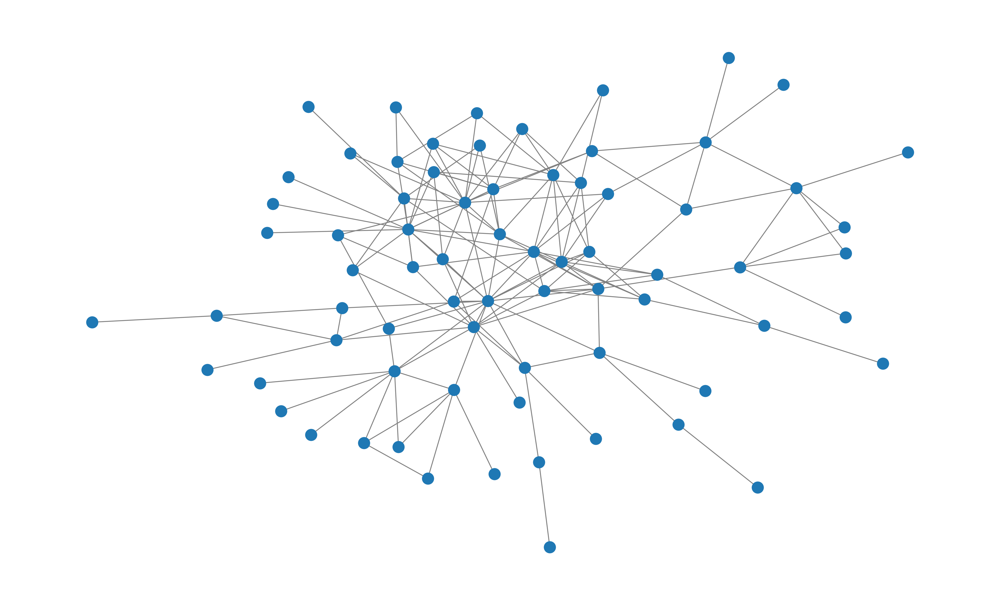

Colorectal cancer - IntAct


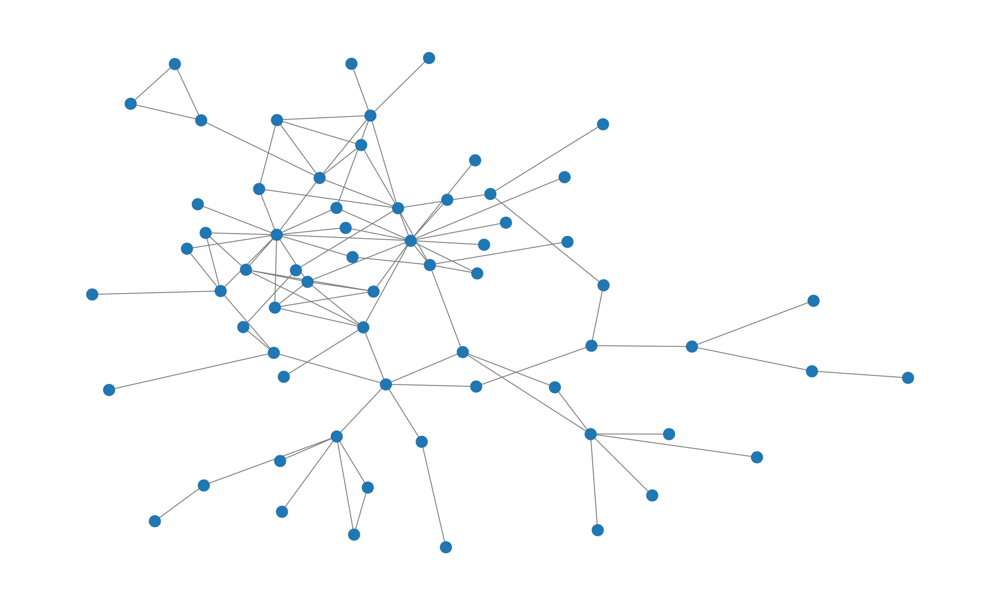

Colorectal cancer - Reactome


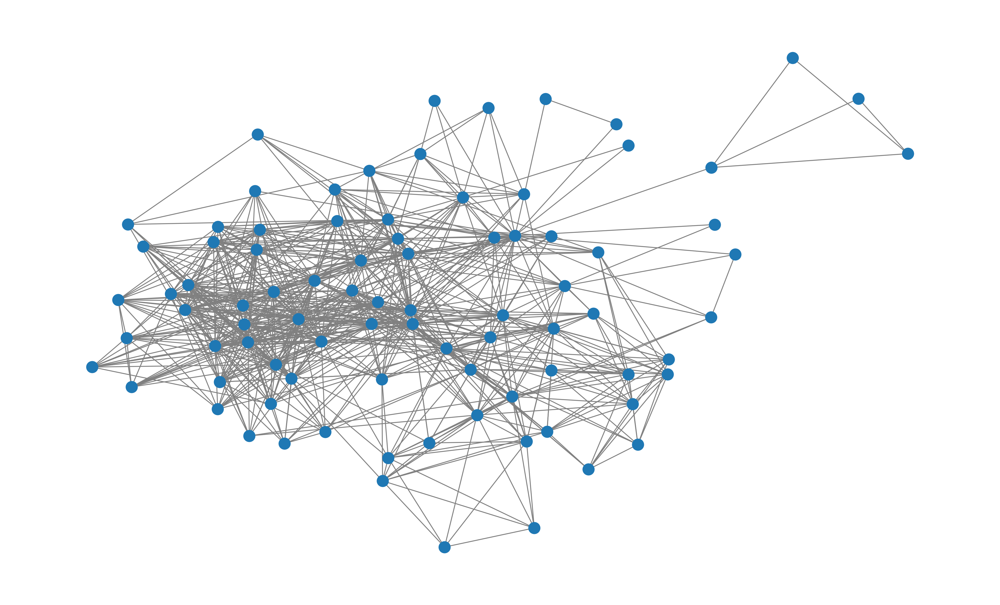

Colorectal cancer - STRING


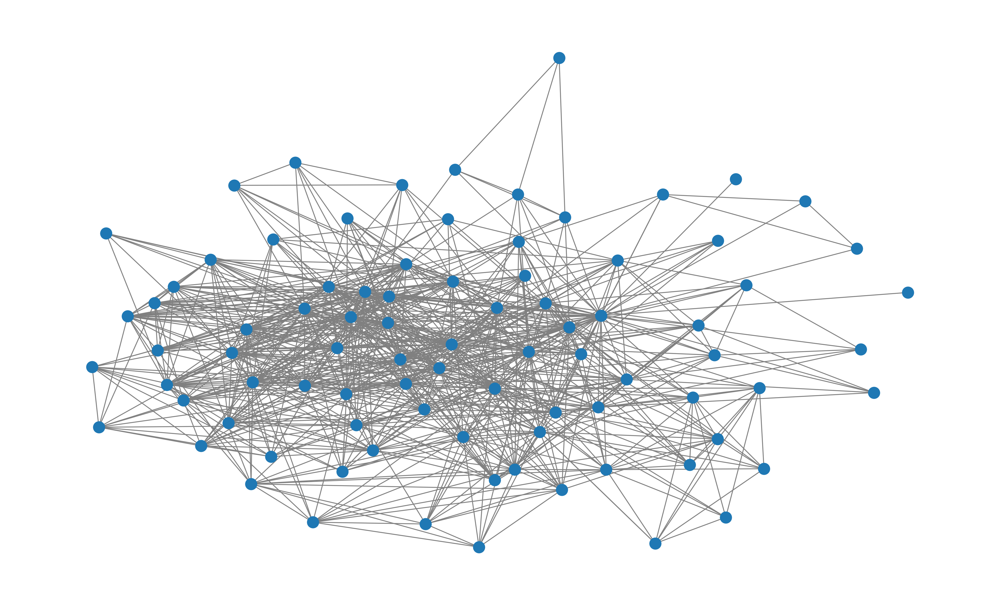

Pancreatic cancer - HINT


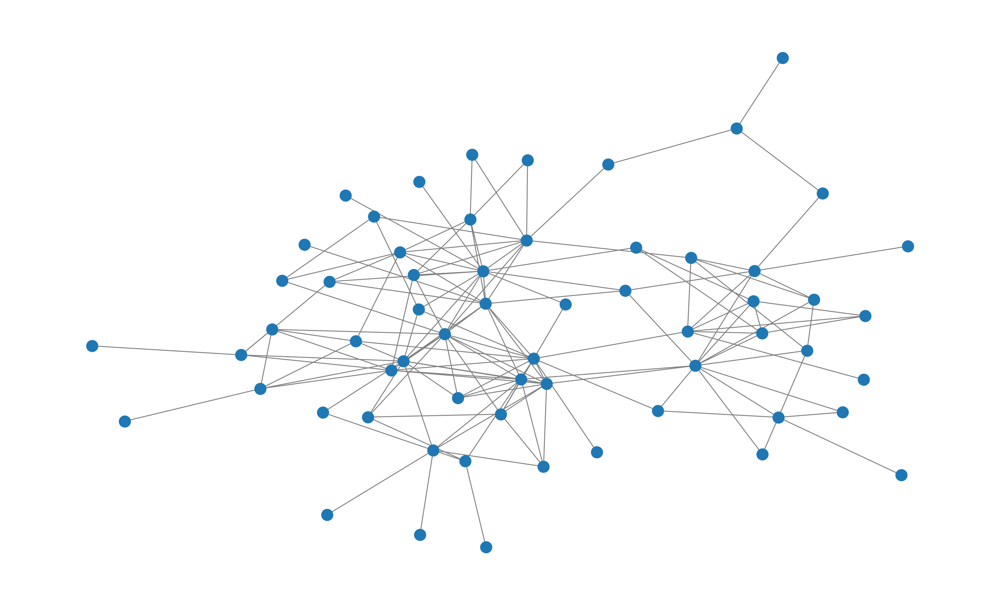

Pancreatic cancer - IntAct


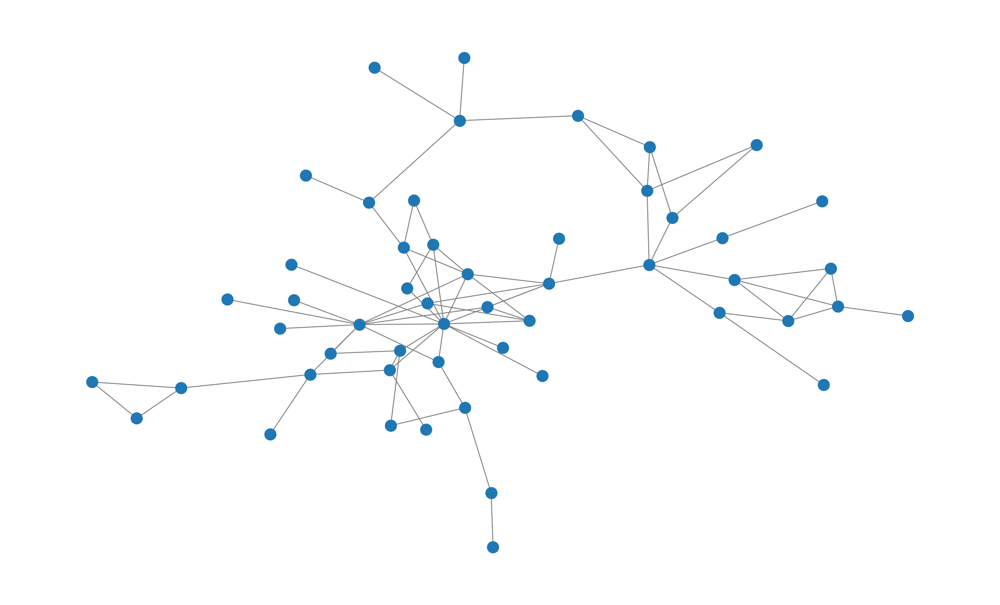

Pancreatic cancer - Reactome


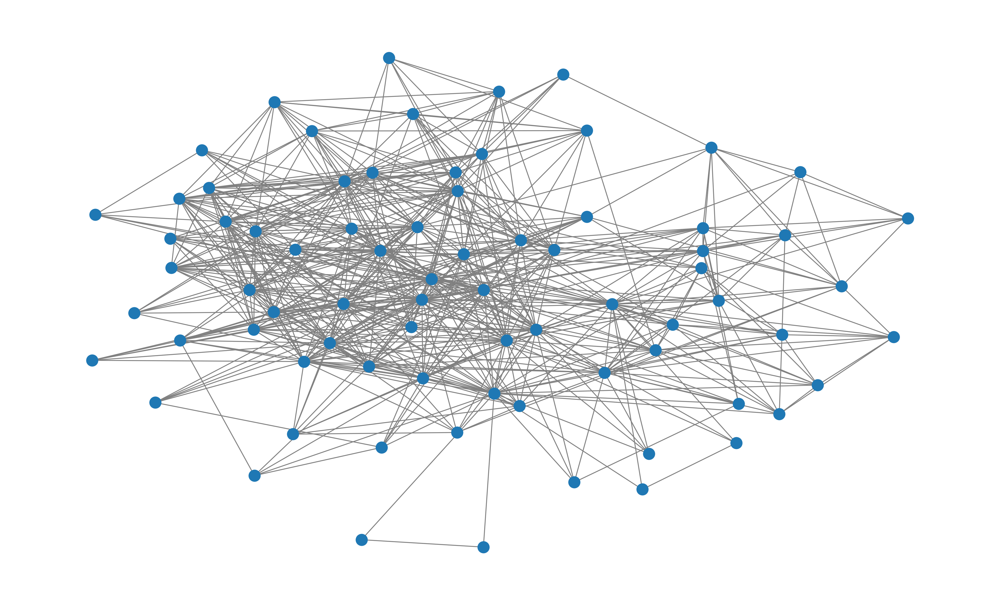

Pancreatic cancer - STRING


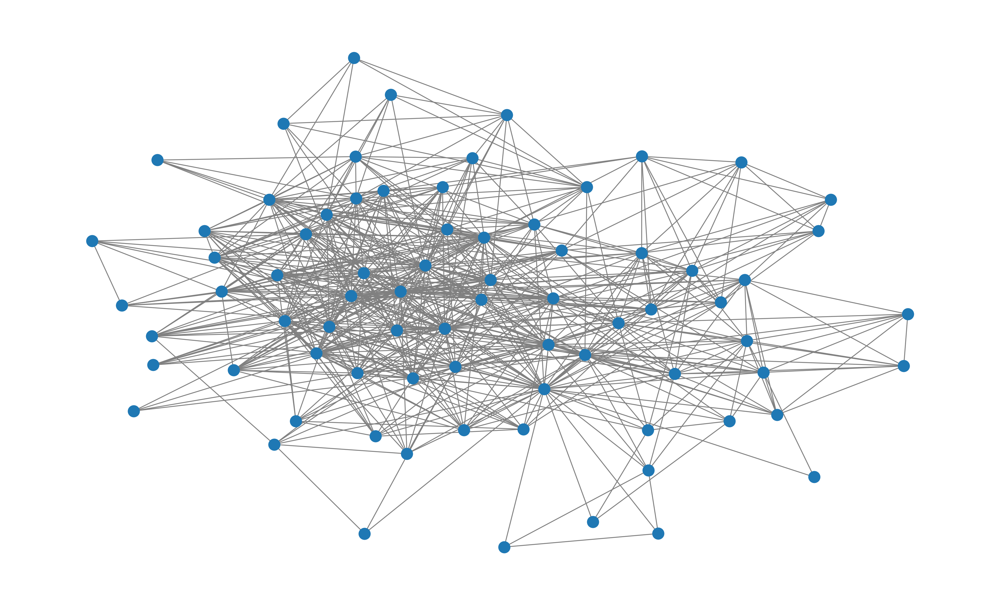

Glioma cancer - HINT


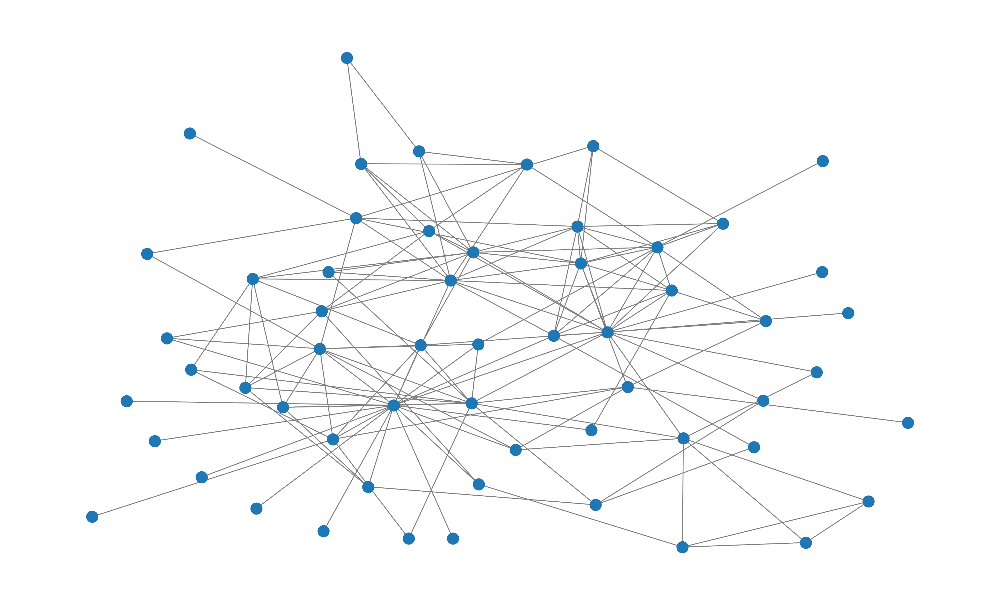

Glioma cancer - IntAct


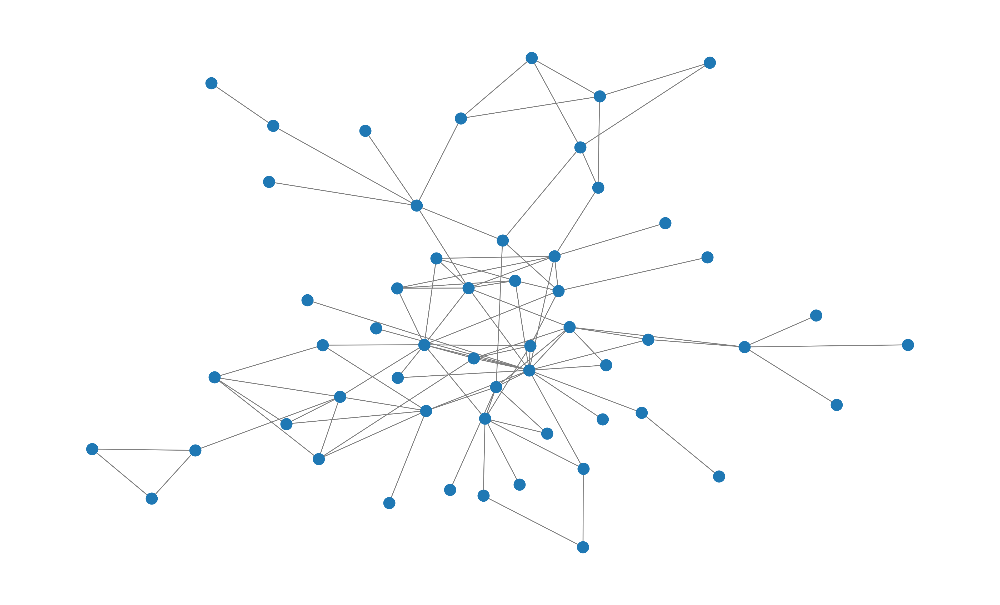

Glioma cancer - Reactome


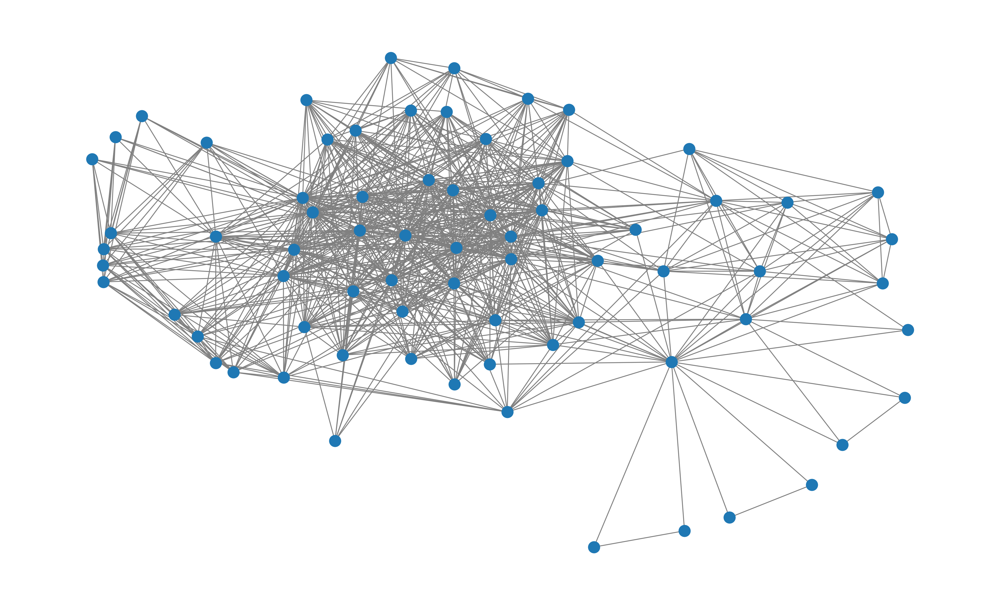

Glioma cancer - STRING


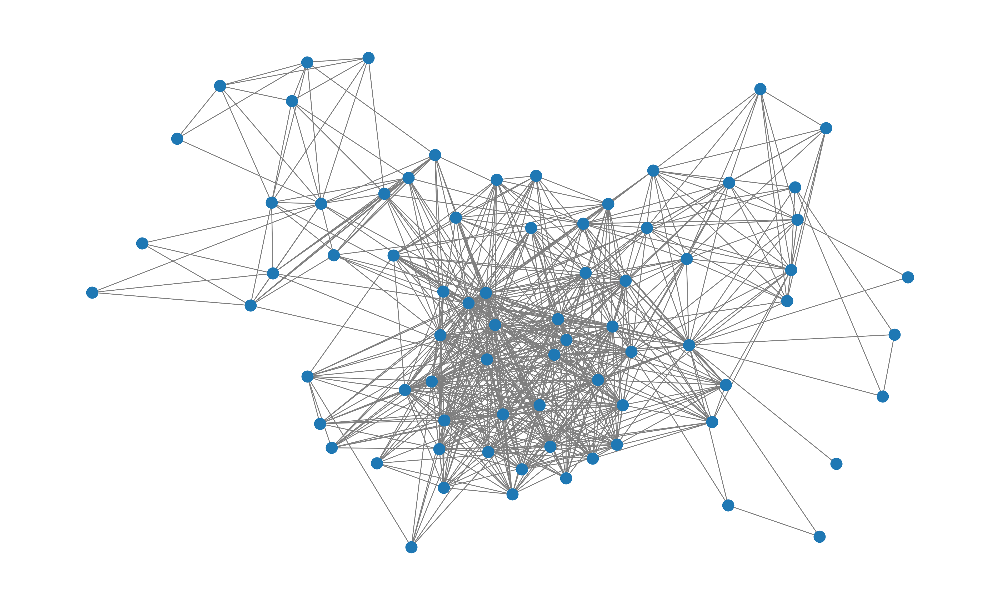

In [52]:
for name, G in subNeworks.items():
    print(name)
    pos=nx.kamada_kawai_layout(G)
    plt.figure(figsize=(15,9),dpi=250)
    nx.draw(G,pos=pos,edge_color='gray',with_labels=0, node_size=150)
    plt.show()

### Edges Intersection

In [30]:
def edgeIntersection(listOfNames):
    resume={}
    for name1 in listOfNames:
        name1Short=name1.split(' - ')[1]
        resume[name1Short]={}
        for name2 in listOfNames:
            name2Short=name2.split(' - ')[1]
            if name1Short==name2Short:
                resume[name1Short][name2Short]=np.nan
            else:
                intersetionSize=len(
                    set([tuple(sorted(edge)) for edge in subNeworks[name1].edges])&
                    set([tuple(sorted(edge)) for edge in subNeworks[name2].edges])
                )
                resume[name1Short][name2Short]=round(intersetionSize/subNeworks[name1].number_of_edges()*100)
    return pd.DataFrame(resume).T   

In [31]:
edgeIntersection(['Colorectal - HINT','Colorectal - IntAct','Colorectal - Reactome','Colorectal - STRING'])

,HINT,IntAct,Reactome,STRING
HINT,NaN,45.0,76.0,83.0
IntAct,71.0,NaN,82.0,86.0
Reactome,16.0,11.0,NaN,85.0
STRING,16.0,10.0,76.0,NaN


In [32]:
edgeIntersection(['Pancreatic - HINT','Pancreatic - IntAct','Pancreatic - Reactome','Pancreatic - STRING'])

,HINT,IntAct,Reactome,STRING
HINT,NaN,37.0,76.0,74.0
IntAct,70.0,NaN,80.0,93.0
Reactome,17.0,10.0,NaN,77.0
STRING,17.0,12.0,78.0,NaN


In [33]:
edgeIntersection(['Glioma - HINT','Glioma - IntAct','Glioma - Reactome','Glioma - STRING'])

,HINT,IntAct,Reactome,STRING
HINT,NaN,51.0,76.0,80.0
IntAct,76.0,NaN,87.0,91.0
Reactome,15.0,12.0,NaN,74.0
STRING,18.0,14.0,80.0,NaN
